In [1]:
import fiona
import json
import pandas as pd
import rasterio
from rasterio.coords import BoundingBox
from rasterio.plot import show
from pathlib import Path
import exiftool as Ex

import numpy as np
import geopandas as gpd
from shapely.geometry import Polygon, Point
import matplotlib.pyplot as plt

In [2]:
geopackage_file = "C:\\Users\\gabri\\Documents\\Projects\\University\\reflectdetect_main\\data\\20240529_uav_multispectral_orthos_20m\\20240529_tarps_locations.gpkg"

orthophotos_dir = "C:\\Users\\gabri\\Documents\\Projects\\University\\reflectdetect_main\\data\\20240529_uav_multispectral_orthos_20m\\orthophotos"

shape = 'sq'
side_length_meters = 1.4

In [3]:
def detect(orthophoto_dir, geopoints_gdf, shape, side_length_meters=None):
    template_path = (Path.cwd() / orthophoto_dir).resolve()
    result_files = []

    if shape not in ['sq', 'rect', 'circ']:
        raise ValueError("shape must be either 'sq', 'rect', or 'circ'")

    # Haversine formula to calculate distance between two points in meters
    def haversine(lat1, lon1, lat2, lon2):
        R = 6378100  # Radius of the Earth in meters
        phi1 = np.radians(lat1)
        phi2 = np.radians(lat2)
        delta_phi = np.radians(lat2 - lat1)
        delta_lambda = np.radians(lon2 - lon1)
        a = np.sin(delta_phi / 2) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2) ** 2
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
        return R * c

    def extract_panel_location_from_image(result_files, shape, side_length_meters):
        panel_locations = []

        for filepath in result_files:
            with rasterio.open(filepath) as dataset:
                if shape == 'sq' and side_length_meters is not None:
                    pixel_size = dataset.res[0]  # Assuming square pixels
                    side_length_pixels = side_length_meters / pixel_size

                    used_points = set()

                    for i, point in geopoints_gdf.iterrows():
                        if point.geometry is not None and i not in used_points:
                            lat1, lon1 = point.geometry.y, point.geometry.x

                            for j, point2 in geopoints_gdf.iterrows():
                                if j > i and point2.geometry is not None and j not in used_points:
                                    lat2, lon2 = point2.geometry.y, point2.geometry.x

                                    # Calculate the distance between the diagonal points
                                    diagonal_distance = np.sqrt(2 * (side_length_meters ** 2))

                                    if np.isclose(haversine(lat1, lon1, lat2, lon2), diagonal_distance, atol=1.0):
                                        # Calculate the other two points
                                        dx = (lon2 - lon1) / 2
                                        dy = (lat2 - lat1) / 2

                                        # Center of the square
                                        center_lon = (lon1 + lon2) / 2
                                        center_lat = (lat1 + lat2) / 2

                                        # Calculate the other two corners
                                        point_b = Point(center_lon - dy, center_lat + dx)
                                        point_d = Point(center_lon + dy, center_lat - dx)

                                        # Convert geographic coordinates to pixel coordinates
                                        row_a, col_a = dataset.index(lon1, lat1)
                                        row_c, col_c = dataset.index(lon2, lat2)
                                        row_b, col_b = dataset.index(point_b.x, point_b.y)
                                        row_d, col_d = dataset.index(point_d.x, point_d.y)

                                        # Check if all points are within the image bounds
                                        if all(0 <= coord < dataset.width for coord in [col_a, col_b, col_c, col_d]) and all(0 <= coord < dataset.height for coord in [row_a, row_b, row_c, row_d]):
                                            panel_locations.append({
                                                "file": str(filepath),
                                                "points": [
                                                    (lon1, lat1),
                                                    (point_b.x, point_b.y),
                                                    (lon2, lat2),
                                                    (point_d.x, point_d.y)
                                                ]
                                            })
                                            used_points.update([i, j])
                                            break

        with open('panel_locations.json', 'w') as f:
            json.dump(panel_locations, f, indent=4)

    # Load each orthophoto
    for filepath in template_path.glob("*.tif"):
        with rasterio.open(filepath) as dataset:
            # Get the bounds of the orthophoto
            bounds = BoundingBox(*dataset.bounds)
            # Create a bounding box geometry
            orthophoto_box = gpd.GeoDataFrame(
                {'geometry': [Polygon(
                    [
                        (bounds.left, bounds.bottom),
                        (bounds.left, bounds.top),
                        (bounds.right, bounds.top),
                        (bounds.right, bounds.bottom)])
                    ]
                }
            )
            # Check if all points from geopoints_gdf are within the bounds
            all_points_within = True
            for _, point in geopoints_gdf.iterrows():
                if 'geometry' in point and point.geometry is not None:
                    if not orthophoto_box.contains(point.geometry).all():
                        all_points_within = False
                        break
            if all_points_within:
                result_files.append(filepath)

    extract_panel_location_from_image(result_files, shape, side_length_meters)

    return result_files

def load_orthophoto(orthophoto_dir):
    template_path = (Path.cwd() / orthophoto_dir).resolve()
    for filepath in template_path.glob("*"):
        yield filepath, gpd.read_file(filepath)

def load_geopackage(filepath):
    geopoints = []
    with fiona.Env():
        layers = fiona.listlayers(filepath)
        for layer in layers:
            gdf = gpd.read_file(filepath, layer=layer)
            geopoints.append(gdf)
    return geopoints

In [4]:
geopoints = load_geopackage(geopackage_file)
geopoints_gdf = gpd.GeoDataFrame(pd.concat(geopoints, ignore_index=True))
geopoints_gdf.to_file('geopoints.geojson', driver='GeoJSON')

matching_files = detect(orthophotos_dir, geopoints_gdf, 'sq', side_length_meters)

NEW

In [5]:
def detect(filepaths, geopoints_gdf, shape, side_length_meters=None):
    result_files = []

    if shape not in ['sq', 'rect', 'circ']:
        raise ValueError("shape must be either 'sq', 'rect', or 'circ'")

    # Haversine formula to calculate distance between two points in meters
    def haversine(lat1, lon1, lat2, lon2):
        R = 6378100  # Radius of the Earth in meters
        phi1 = np.radians(lat1)
        phi2 = np.radians(lat2)
        delta_phi = np.radians(lat2 - lat1)
        delta_lambda = np.radians(lon2 - lon1)
        a = np.sin(delta_phi / 2) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2) ** 2
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
        return R * c

    def extract_panel_location_from_image(result_files, shape, side_length_meters):
        panel_locations = []
        # TODO: Check if its a display problem with matplotlib otherwise add distortion correction
        #  (See test.ipynb)
        for filepath in result_files:
            with rasterio.open(filepath) as dataset:
                if shape == 'sq' and side_length_meters is not None:
                    pixel_size = dataset.res[0]  # Assuming square pixels
                    side_length_pixels = side_length_meters / pixel_size

                    used_points = set()

                    for i, point in geopoints_gdf.iterrows():
                        if point.geometry is not None and i not in used_points:
                            lat1, lon1 = point.geometry.y, point.geometry.x

                            for j, point2 in geopoints_gdf.iterrows():
                                if j > i and point2.geometry is not None and j not in used_points:
                                    lat2, lon2 = point2.geometry.y, point2.geometry.x

                                    # Calculate the distance between the diagonal points
                                    diagonal_distance = np.sqrt(2 * (side_length_meters ** 2))

                                    if np.isclose(haversine(lat1, lon1, lat2, lon2), diagonal_distance, atol=1.0):
                                        # Calculate the other two points
                                        dx = (lon2 - lon1) / 2
                                        dy = (lat2 - lat1) / 2

                                        # Center of the square
                                        center_lon = (lon1 + lon2) / 2
                                        center_lat = (lat1 + lat2) / 2

                                        # Calculate the other two corners
                                        point_b = Point(center_lon - dy, center_lat + dx)
                                        point_d = Point(center_lon + dy, center_lat - dx)

                                        # Convert geographic coordinates to pixel coordinates
                                        row_a, col_a = dataset.index(lon1, lat1)
                                        row_c, col_c = dataset.index(lon2, lat2)
                                        row_b, col_b = dataset.index(point_b.x, point_b.y)
                                        row_d, col_d = dataset.index(point_d.x, point_d.y)

                                        # Check if all points are within the image bounds
                                        if all(0 <= coord < dataset.width for coord in [col_a, col_b, col_c, col_d]) and all(0 <= coord < dataset.height for coord in [row_a, row_b, row_c, row_d]):
                                            panel_locations.append({
                                                "file": str(filepath),
                                                "points": [
                                                    (lon1, lat1),
                                                    (point_b.x, point_b.y),
                                                    (lon2, lat2),
                                                    (point_d.x, point_d.y)
                                                ]
                                            })
                                            used_points.update([i, j])
                                            break
                elif shape == "rect":
                    # TODO: Implement rect detection
                    pass
                elif shape == "circ":
                    # TODO: Implement circ detection
                    pass

        with open('panel_locations.json', 'w') as f:
            json.dump(panel_locations, f, indent=4)

    # Load each orthophoto
    for filepath in filepaths:
        with rasterio.open(filepath) as dataset:
            # Get the bounds of the orthophoto
            bounds = BoundingBox(*dataset.bounds)
            # Create a bounding box geometry
            orthophoto_box = gpd.GeoDataFrame(
                {'geometry': [Polygon(
                    [
                        (bounds.left, bounds.bottom),
                        (bounds.left, bounds.top),
                        (bounds.right, bounds.top),
                        (bounds.right, bounds.bottom)])
                    ]
                }
            )
            # Check if all points from geopoints_gdf are within the bounds
            all_points_within = True
            for _, point in geopoints_gdf.iterrows():
                if 'geometry' in point and point.geometry is not None:
                    if not orthophoto_box.contains(point.geometry).all():
                        all_points_within = False
                        break
            if all_points_within:
                result_files.append(filepath)

    extract_panel_location_from_image(result_files, shape, side_length_meters)

    return result_files

def load_orthophoto(orthophoto_dir):
    template_path = Path(orthophoto_dir).resolve()
    return [filepath for filepath in template_path.glob("*.tif")]

def load_orthophoto_with_data(orthophoto_dir):
    template_path = Path(orthophoto_dir).resolve()
    photos = []
    for filepath in template_path.glob("*.tif"):
        with rasterio.open(filepath) as dataset:
            photos.append((filepath, dataset.read()))
    return photos

def load_geopackage(geopackage_dir):
    geopoints = []
    with fiona.Env():
        layers = fiona.listlayers(geopackage_dir)
        for layer in layers:
            gdf = gpd.read_file(geopackage_dir, layer=layer)
            geopoints.append(gdf)
    return geopoints

In [ ]:
geopoints = load_geopackage(geopackage_file)
geopoints_gdf = gpd.GeoDataFrame(pd.concat(geopoints, ignore_index=True))
geopoints_gdf.to_file('geopoints.geojson', driver='GeoJSON')

# Load orthophoto paths
orthophoto_files = load_orthophoto(orthophotos_dir)

# Detect panels in the orthophotos
matching_files = detect(orthophoto_files, geopoints_gdf, shape, side_length_meters)
print(matching_files)

# Load orthophotos with data for further processing
orthophoto_data = load_orthophoto_with_data(orthophotos_dir)

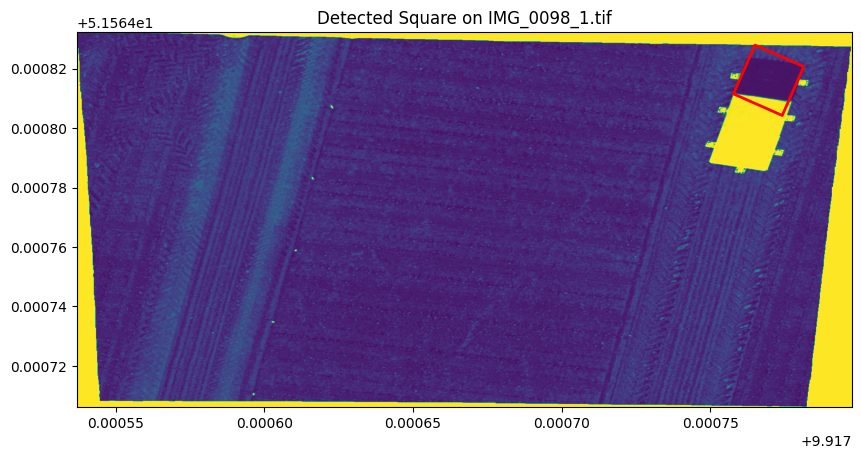

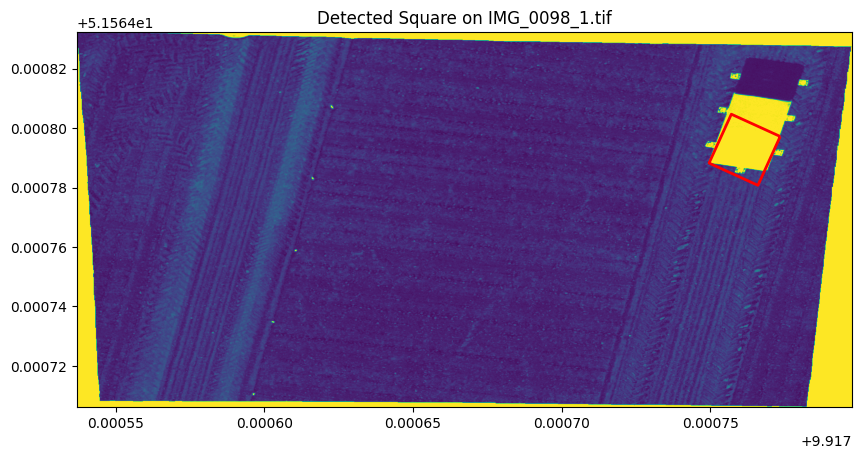

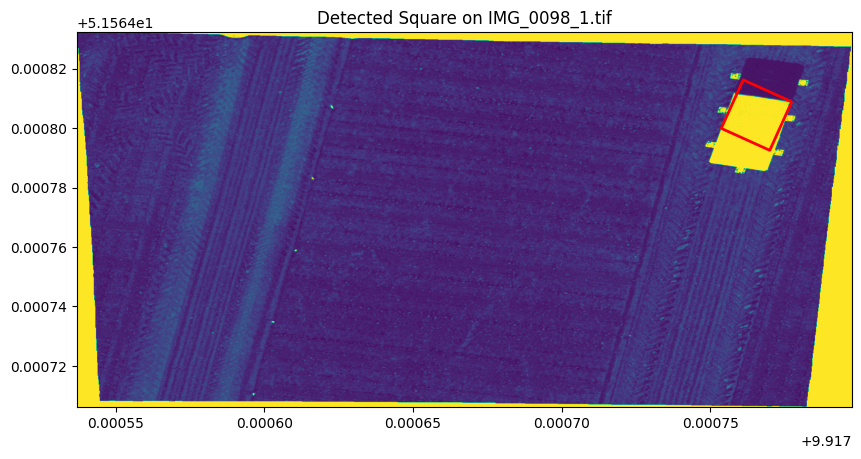

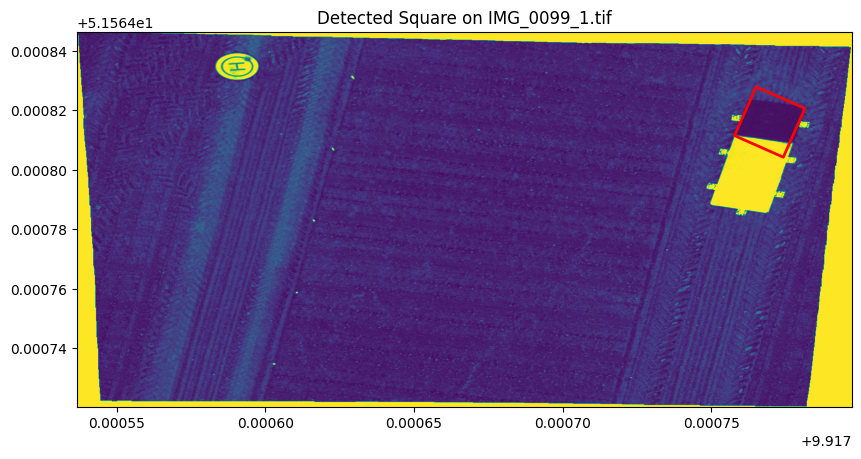

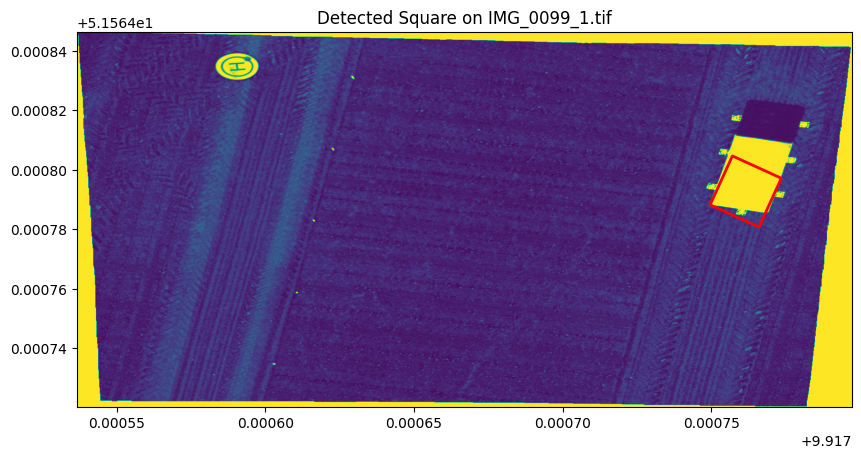

...

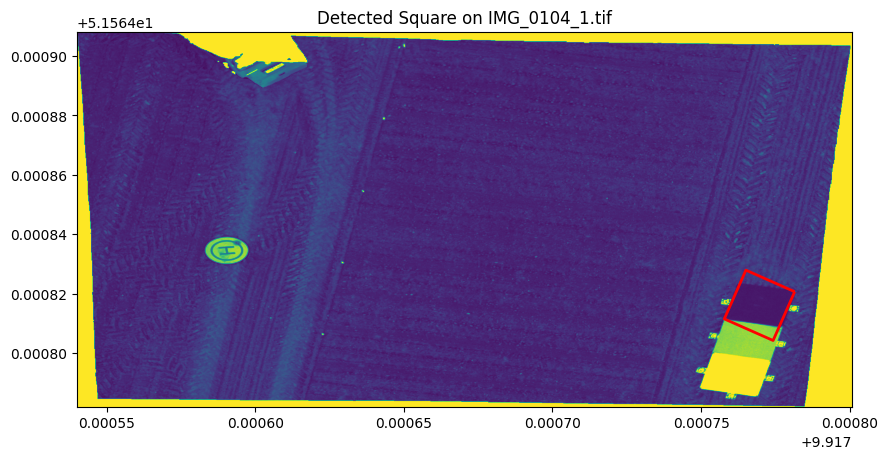

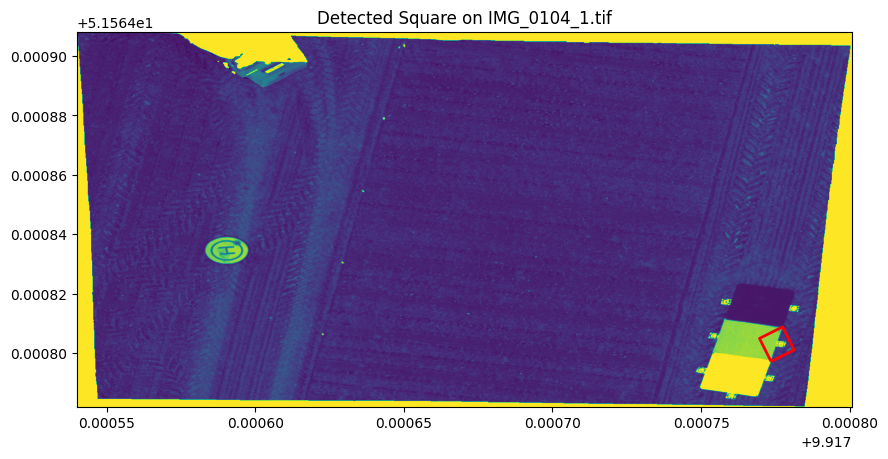

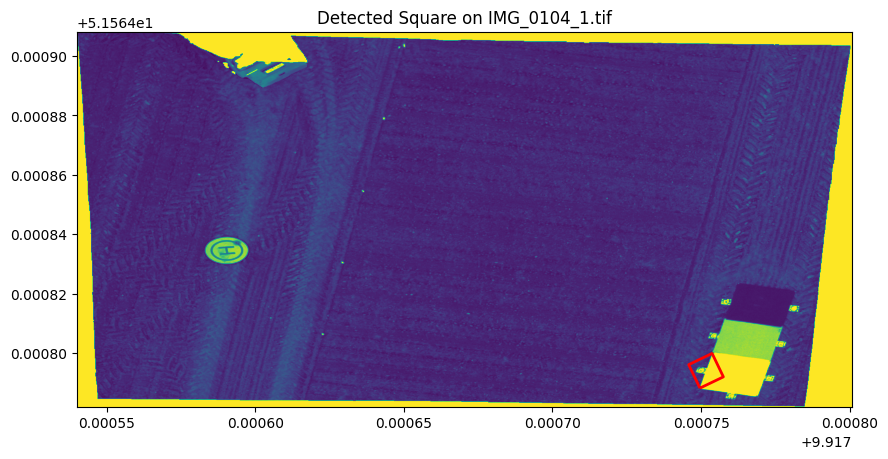

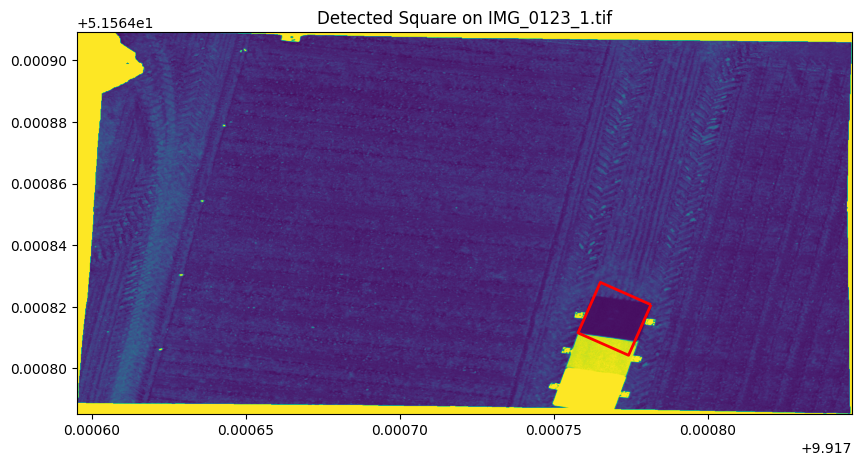

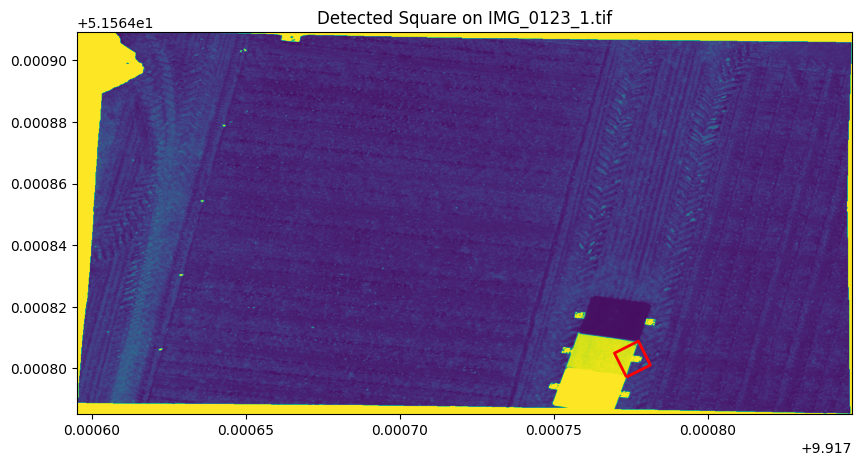

KeyboardInterrupt: 

In [104]:
def plot_detected_squares(json_file):
    # Load the JSON file containing the panel locations
    with open(json_file, 'r') as f:
        panel_locations = json.load(f)

    for panel in panel_locations:
        file_path = Path(panel['file']).resolve()
        points = panel['points']
        
        # Open the orthophoto image
        with rasterio.open(file_path) as dataset:
            fig, ax = plt.subplots(figsize=(10, 10))
            show(dataset, ax=ax)
            
            # Convert the points into a list of (longitude, latitude) tuples
            square_coords = [(point[0], point[1]) for point in points]
            square_coords.append(square_coords[0])  # Close the square
            
            # Create a Polygon from the coordinates
            square = Polygon(square_coords)
            
            # Plot the square on the orthophoto
            gpd.GeoSeries([square]).plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
            
            plt.title(f"Detected Square on {file_path.name}")
            plt.show()

plot_detected_squares('C:\\Users\\gabri\\Documents\\Projects\\University\\reflectdetect_main\\src\\panel_locations.json')
